In [17]:
# Importing necessary libraries
import numpy as np
import pandas as pd
pd.DataFrame.iteritems = pd.DataFrame.items
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [19]:
# Import data
# Loading dataset
from sklearn.datasets import fetch_california_housing
data = fetch_california_housing()
X = pd.DataFrame(data.data, columns=data.feature_names)
y = pd.Series(data.target)

data

{'data': array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
           37.88      , -122.23      ],
        [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
           37.86      , -122.22      ],
        [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
           37.85      , -122.24      ],
        ...,
        [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
           39.43      , -121.22      ],
        [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
           39.43      , -121.32      ],
        [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
           39.37      , -121.24      ]]),
 'target': array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]),
 'frame': None,
 'target_names': ['MedHouseVal'],
 'feature_names': ['MedInc',
  'HouseAge',
  'AveRooms',
  'AveBedrms',
  'Population',
  'AveOccup',
  'Latitude',
  'Longitude'],
 'DESCR': '.. _california_housing_dataset:\n

In [4]:
X

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25
...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32


In [5]:
y

0        4.526
1        3.585
2        3.521
3        3.413
4        3.422
         ...  
20635    0.781
20636    0.771
20637    0.923
20638    0.847
20639    0.894
Length: 20640, dtype: float64

In [23]:
# Importing necessary libraries
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.datasets import fetch_california_housing

In [25]:
# Loading the dataset
# Target variable is the median house value for Cali districts
# Expressed in hundreds of thousands of dollars ($100,00)
data = fetch_california_housing()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

In [27]:
# Basic statistics
print(df.describe())
print("\n")
print(df['target'].value_counts())

             MedInc      HouseAge      AveRooms     AveBedrms    Population  \
count  20640.000000  20640.000000  20640.000000  20640.000000  20640.000000   
mean       3.870671     28.639486      5.429000      1.096675   1425.476744   
std        1.899822     12.585558      2.474173      0.473911   1132.462122   
min        0.499900      1.000000      0.846154      0.333333      3.000000   
25%        2.563400     18.000000      4.440716      1.006079    787.000000   
50%        3.534800     29.000000      5.229129      1.048780   1166.000000   
75%        4.743250     37.000000      6.052381      1.099526   1725.000000   
max       15.000100     52.000000    141.909091     34.066667  35682.000000   

           AveOccup      Latitude     Longitude        target  
count  20640.000000  20640.000000  20640.000000  20640.000000  
mean       3.070655     35.631861   -119.569704      2.068558  
std       10.386050      2.135952      2.003532      1.153956  
min        0.692308     32.54000

In [29]:
df

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


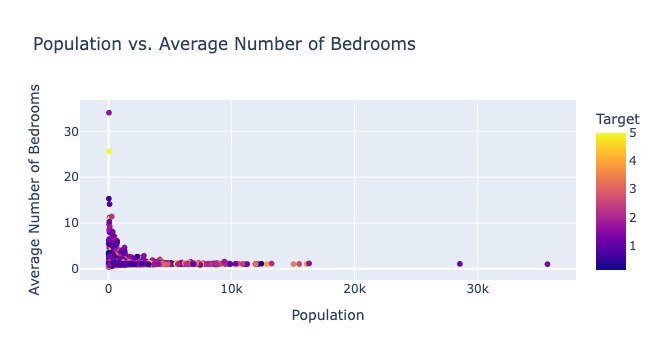

In [31]:
# Scatter plot of mean radius vs. mean texture, colored by target
# is there a difference in size and texture of begien and malignant
fig = px.scatter(df, x='Population', y='AveBedrms', color='target',
                 labels={'Population': 'Population', 'AveBedrms': 'Average Number of Bedrooms', 'target': 'Target'},
                 title='Population vs. Average Number of Bedrooms')
fig.show()

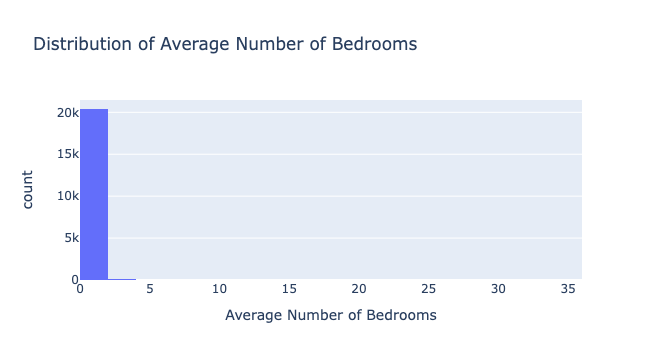

In [57]:
# Distribution of Number of Bedrooms
fig = px.histogram(df, x='AveBedrms', nbins=20,
                   labels={'AveBedrms': 'Average Number of Bedrooms', 'target': 'Target'},
                   title='Distribution of Average Number of Bedrooms')
fig.show()

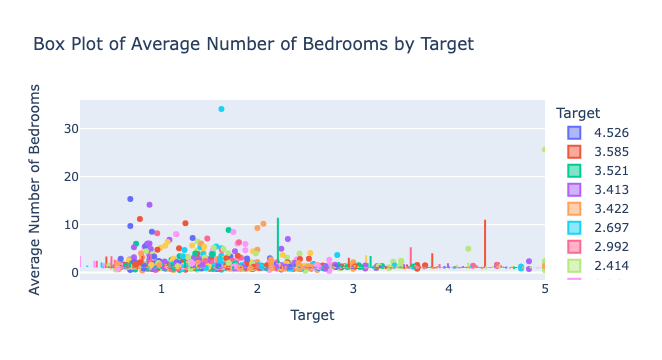

In [35]:
# Box plot of mean radius by target
fig = px.box(df, x='target', y='AveBedrms', color='target',
             labels={'AveBedrms': 'Average Number of Bedrooms', 'target': 'Target'},
             title='Box Plot of Average Number of Bedrooms by Target')
fig.show()

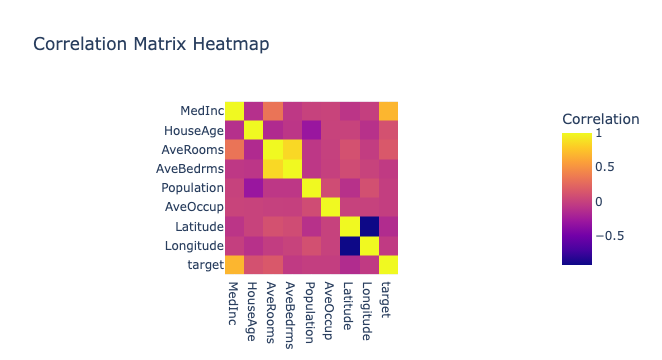

In [37]:
# Correlation heatmap
correlation_matrix = df.corr()
fig = px.imshow(correlation_matrix, labels={'color': 'Correlation'}, title='Correlation Matrix Heatmap')
fig.show()

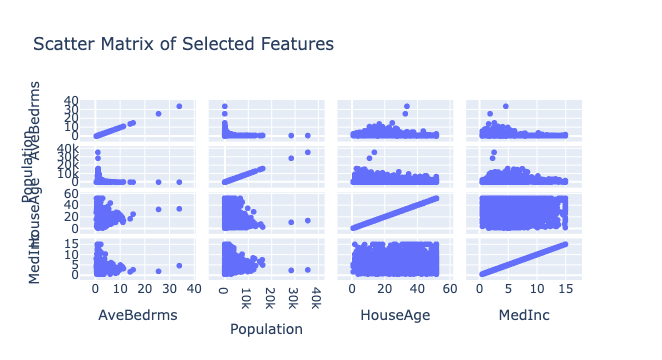

In [59]:
# Pair plot of selected features
selected_features = ['AveBedrms', 'Population', 'HouseAge', 'MedInc']
fig = px.scatter_matrix(df, dimensions=selected_features,
                        labels={col: col.replace(' ', '_') for col in selected_features},
                        title='Scatter Matrix of Selected Features')
fig.show()

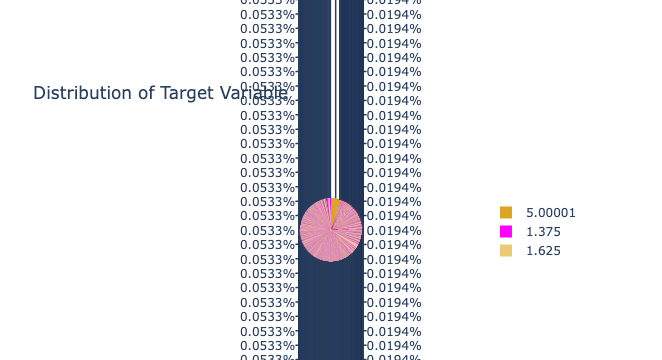

In [41]:
# Distribution of the target variable
fig = px.pie(df, names='target', title='Distribution of Target Variable', 
             labels={'target': 'Target'},
             color_discrete_sequence=["goldenrod", "magenta"])
#              color_discrete_sequence=px.colors.sequential.RdBu)
#              color_discrete_map={1: 'blue', 0: 'red'})
fig.show()

In [ ]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [61]:
X_train

NameError: name 'X_train' is not defined